# Meteoritos, misiones espaciales y exoplanetas: un viaje basado en datos

<br>
<center><img src="https://i.imgur.com/rbHRojl.jpg" width="70%"></center>
<br>

<h3 style="color:#d9ad26;">"¿Y si este titular es más real de lo que pensamos? ¿Se puede salvar a la humanidad con datos?"</h3>


En este proyecto...
 

Analizaremos un conjunto de datos sobre meteoritos, donde resolveremos cuestiones como:
* ¿Qué masa media tienen los meteoritos que hemos registrado?
* ¿En qué años se registraron más meteoritos?
* ¿Dónde han caído los meteoritos? ¿En qué hemisferio se han registrado más?
 

Analizaremos un conjunto de datos sobre exoplanetas, donde resolveremos cuestiones como:
* ¿En qué años se descubrieron más exoplanetas? ¿Cuándo fue el primero?
* ¿Cuál es el método más efectivo para encontrarlos?
* ¿Cuál es el centro de descubrimiento más importante?
 

Analizaremos un conjunto de datos sobre todas las misiones espaciales, donde resolveremos cuestiones como:
* ¿Qué porcentaje de misiones espaciales ha sido un éxito y cuál es la tasa de fracaso?
* ¿Qué países han mandado más misiones espaciales?
* ¿Cuál es la compañía con mejor porcentaje de éxito?

---

El objetivo de este proyecto será analizar estos tres conjuntos de datos para estudiar el peligro de impacto por parte de los meteoritos y encontrar patrones de comportamiento. Por otro lado, se analizarán los exoplanetas que nos puedan alojar en un futuro. Y terminaremos analizando las misiones espaciales para encontrar los parámetros que han cosechado mejor éxito en las misiones.

---

In [1]:
#Librerías básicas
import pandas as pd
import numpy as np

#Librerías de visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px
import plotly.subplots as sp
from matplotlib.image import imread
from plotly.subplots import make_subplots

#Librerías de mapas
from mpl_toolkits.basemap import Basemap
import folium
from folium.plugins import MarkerCluster

import re



# <center> METEORITOS <center>

**EXPLICACIÓN**
- "name": El nombre del meteorito.
- "id": El identificador único del meteorito.
- "nametype": El tipo de nombre asignado al meteorito.
- "recclass": La clase de meteorito según la taxonomía establecida.
- "mass": La masa del meteorito en gramos.
- "fall": Indica si el meteorito cayó en forma controlada o incontrolada.
- "year": El año en el que el meteorito cayó en la Tierra.
- "reclat": La latitude en la que el meteorito cayó.
- "reclong": La longitude en la que el meteorito cayó.
- "GeoLocation": La ubicación geográfica en formato de cadena de caracteres

# IMPORTACIÓN E INFORMACIÓN DEL DATASET

In [2]:
# Data de los meteoritos
df_meteorites = pd.read_csv("datasets proyecto final/meteorite-landings.csv")
df_meteorites.head()

,name,id,nametype,recclass,mass,fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775000, 6.083330)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.183330, 10.233330)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.216670, -113.000000)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.883330, -99.900000)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.166670, -64.950000)"


In [3]:
# Vemos el tamaño del dataframe
df_meteorites.shape

(45716, 10)

In [4]:
# Ahora la información general
df_meteorites.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45716 non-null  object 
 1   id           45716 non-null  int64  
 2   nametype     45716 non-null  object 
 3   recclass     45716 non-null  object 
 4   mass         45585 non-null  float64
 5   fall         45716 non-null  object 
 6   year         45428 non-null  float64
 7   reclat       38401 non-null  float64
 8   reclong      38401 non-null  float64
 9   GeoLocation  38401 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.5+ MB


In [5]:
# Un describe para hacernos una idea de todas las variables numéricas
df_meteorites.describe()

,id,mass,year,reclat,reclong
count,45716.000000,4.558500e+04,45428.000000,38401.000000,38401.000000
mean,26889.735104,1.327808e+04,1991.772189,-39.122580,61.074319
std,16860.683030,5.749889e+05,27.181247,46.378511,80.647298
min,1.000000,0.000000e+00,301.000000,-87.366670,-165.433330
25%,12688.750000,7.200000e+00,1987.000000,-76.714240,0.000000
50%,24261.500000,3.260000e+01,1998.000000,-71.500000,35.666670
75%,40656.750000,2.026000e+02,2003.000000,0.000000,157.166670
max,57458.000000,6.000000e+07,2501.000000,81.166670,354.473330


In [6]:
# Observamos los valores nulos
df_meteorites.isnull().mean().sort_values(ascending=False)*100

reclat         16.000962
reclong        16.000962
GeoLocation    16.000962
year            0.629976
mass            0.286552
name            0.000000
id              0.000000
nametype        0.000000
recclass        0.000000
fall            0.000000
dtype: float64

# ANÁLISIS EXPLORATORIO DE DATOS

---

#### CORRELACIÓN DE VARIABLES

C:\Users\sjfer\AppData\Local\Temp\ipykernel_460\3413313039.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_meteorites.corr(method = 'spearman').sort_values(by = 'id', axis = 0, ascending = False).sort_values(by = 'id', axis = 1, ascending = False).round(1)


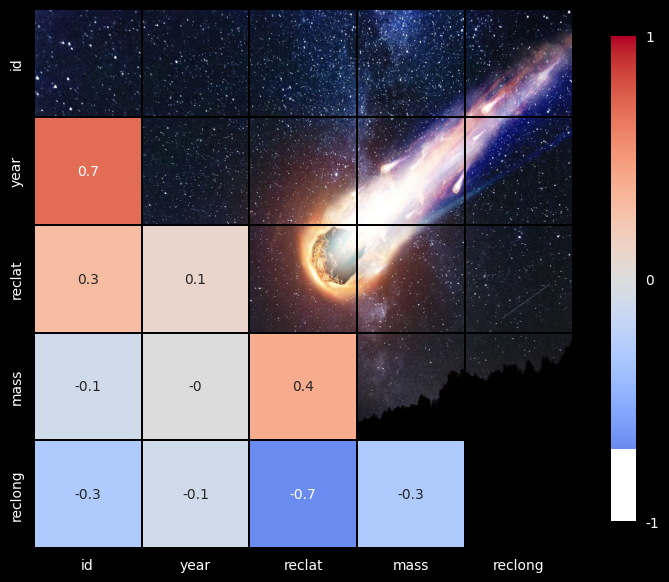

In [7]:
# Spearman sirve para comprobar la relación lineal entre dos variables.

corr = df_meteorites.corr(method = 'spearman').sort_values(by = 'id', axis = 0, ascending = False).sort_values(by = 'id', axis = 1, ascending = False).round(1)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,7))
f.set_facecolor("black")

cmap = "coolwarm"

#Añadimos la imagen de fondo que nos hemos descargado
img = imread(r"C:\Users\sjfer\Silvilio python upgrade hub\Modulo Proyecto final\imagenes\pexels-pixabay-220201.jpg")

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr.iloc[0:5,0:5], mask=mask[0:5,0:5], cmap=cmap, vmax=1, center=0,
    square=True ,linewidths=.1, linecolor="black", cbar_kws={"shrink": 0.9},annot = True, annot_kws={"size": 10})

cbar = ax.collections[0].colorbar
cbar.set_ticks([-1,0,1])
cbar.set_ticklabels(["-1","0","1"])

for t in cbar.ax.get_yticklabels():
    t.set_color("white")
ax.tick_params(axis='x', labelcolor='white')

f.set_facecolor("black")  #fondo negro
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10 , color='white', rotation= 0)  # Variables blancas
ax.set_yticklabels(ax.get_yticklabels(),fontsize=10 , color='white')  # Variables blancas

plt.imshow(img, zorder=0, extent=[0, 6, 0, 5], origin="lower")


plt.show()

Comprobamos que no existe ninguna relación destacable

---

#### ¿CUÁNTA MASA TIENEN LOS METEORITOS QUE HAN CAÍDO A LA TIERRA?

In [8]:
# Sacamos un top 5 de los meteoritos con más masa
df_meteorites.nlargest(5, "mass")

,name,id,nametype,recclass,mass,fall,year,reclat,reclong,GeoLocation
16383,Hoba,11890,Valid,"Iron, IVB",60000000.0,Found,1920.0,-19.58333,17.91667,"(-19.583330, 17.916670)"
5336,Cape York,5262,Valid,"Iron, IIIAB",58200000.0,Found,1818.0,76.13333,-64.93333,"(76.133330, -64.933330)"
5329,Campo del Cielo,5247,Valid,"Iron, IAB-MG",50000000.0,Found,1575.0,-27.46667,-60.58333,"(-27.466670, -60.583330)"
5333,Canyon Diablo,5257,Valid,"Iron, IAB-MG",30000000.0,Found,1891.0,35.05000,-111.03333,"(35.050000, -111.033330)"
3433,Armanty,2335,Valid,"Iron, IIIE",28000000.0,Found,1898.0,47.00000,88.00000,"(47.000000, 88.000000)"


In [9]:
# Nombramos dos variables, una de meteoritos con menos de 100 gramos de masa y otra con meteoritos mayores de 2 toneladas.
meteoritos_pequeños = df_meteorites[df_meteorites['mass'] < 100]
meteoritos_gigantes = df_meteorites[df_meteorites['mass'] > 2000000]


In [10]:
#  Obtenemos la suma de todas las masas de los meteoritos registrados en la tierra
df_meteorites["mass"].sum()

605281210.6380001

In [11]:
# Relación de cantidad de meteoritos según su peso, por debajo de 100 gramos están la mayoría.
fig = px.histogram(meteoritos_pequeños, x='mass', nbins=50, height=400)
fig.show()

In [12]:
# Gráfico de violín para observar la verdadera relación entre la cantidad de los meteoritos según su masa.
# Se pueden observar algunos meteoritos sueltos de varias toneladas, pero la mayoría no supera el kilo de masa.

fig2 = px.violin(df_meteorites, x='mass', box=True, points="all")
fig2.update_layout(
paper_bgcolor='rgba(0,0,0,0)',
plot_bgcolor='rgba(0,0,0,0)',
barmode="overlay",
    bargap=0.1,
    bargroupgap=0.2,
    )
fig2.update_xaxes(showline=True, linewidth=1, linecolor="#d9ad26")
fig2.update_yaxes(showline=True, linewidth=1, linecolor="#d9ad26")
fig2.update_traces(line=dict(color="#d9ad26"))
fig2.update_traces(pointpos=-1.5,marker=dict(color="#d9ad26", size=8))
fig2.update_layout(
    xaxis_title_text='mass',
    yaxis_title_text='count',
    xaxis_title_font=dict(color='white'),
    yaxis_title_font=dict(color='white'),
    xaxis_tickfont=dict(color='white'),
    yaxis_tickfont=dict(color='white')
)
fig2.show()

In [13]:
# Aquí podemos obsevar la relación de descubrimientos de meteoritos a lo largo del tiempo. 
# Del año 1920 a 2012. Antes de esta época no hay nada destacable.

data_1500_2020 = df_meteorites[(df_meteorites["year"] >= 1920) & (df_meteorites["year"] <= 2012)]

fig = px.histogram(data_1500_2020, x='year', nbins=100, height=400)
fig.show()

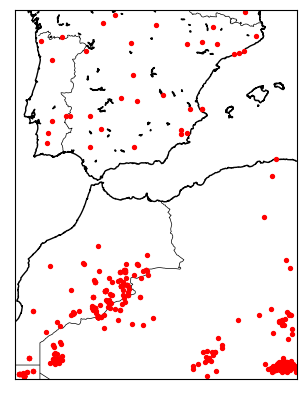

In [14]:
# Crea un mapa de Europa
m = Basemap(projection='merc',llcrnrlat=27,urcrnrlat=43,\
            llcrnrlon=-10,urcrnrlon=5,resolution='h')
m.drawcoastlines()
m.drawcountries()

# Obtiene las coordenadas de los lugares donde han caído meteoritos en Europa
lats = df_meteorites[(df_meteorites['reclat'] > 27) & (df_meteorites['reclat'] < 43) & (df_meteorites['reclong'] > -10) & (df_meteorites['reclong'] < 5)]['reclat'].values
lons = df_meteorites[(df_meteorites['reclat'] > 27) & (df_meteorites['reclat'] < 43) & (df_meteorites['reclong'] > -10) & (df_meteorites['reclong'] < 5)]['reclong'].values
x, y = m(lons, lats)

# Dibuja un marcador en el mapa para cada caída de meteorito
m.scatter(x, y, marker='o', color='red', s=8, zorder=2)

# Muestra el mapa
plt.show()

In [15]:
# Crea un mapa de España centrado en el país
mapa = folium.Map(location=[39, -2], zoom_start=6)

# Añade un título al mapa
folium.Marker(location=[40, -4], popup='<b>Caída de meteoritos</b>').add_to(mapa)

# Obtiene las coordenadas de los lugares donde han caído meteoritos en España
lats = df_meteorites[(df_meteorites['reclat'] > 36) & (df_meteorites['reclat'] < 43) & (df_meteorites['reclong'] > -9) & (df_meteorites['reclong'] < 4)]['reclat'].values
lons = df_meteorites[(df_meteorites['reclat'] > 36) & (df_meteorites['reclat'] < 43) & (df_meteorites['reclong'] > -9) & (df_meteorites['reclong'] < 4)]['reclong'].values

# Dibuja un marcador en el mapa para cada caída de meteorito
for lat, lon in zip(lats, lons):
    row = df_meteorites[(df_meteorites['reclat']==lat) & (df_meteorites['reclong']==lon)].iloc[0]
    year = row['year']
    mass = row['mass']
    folium.CircleMarker([lat, lon], radius=5, color='red', fill=True, 
                        popup=f"Año de caída: {year} - Masa: {mass}").add_to(mapa)


# Muestra el mapa
mapa.save("mapa_espana.html")

**Informativo**
- Un asteroide y un meteorito no son lo mismo. Un asteroide es un objeto rocoso o metálico que se encuentra en el espacio y gira alrededor del sol.
- Un meteorito, por otro lado, es un asteroide que ha entrado en la atmósfera de la Tierra y ha alcanzado la superficie.

**Informativo**
- Un asteroide y un meteorito no son lo mismo. Un asteroide es un objeto rocoso o metálico que se encuentra en el espacio y gira alrededor del sol.
- Un meteorito, por otro lado, es un asteroide que ha entrado en la atmósfera de la Tierra y ha alcanzado la superficie.

El meteorito que se cree que provocó la extinción de los dinosaurios tuvo unas dimensiones estimadas de 10 a 15km. Su masa podría haber sido de miles de millones de toneladas.

Mientras tanto, el meteorito más grande de este dataset, tiene 60 toneladas. 
Y el meteorito más grande que ha caído en españa tiene 162kg de masa, lo que equivaldría a 30 cm de diámetro.

In [16]:
df_meteorites.shape

(45716, 10)

In [17]:
mapa = folium.Map(location=[39, -2], zoom_start=2)

# Añade un título al mapa
folium.Marker(location=[40, -4], popup='<b>Caída de meteoritos</b>').add_to(mapa)

#Borramos los valores nulos en las coordenadas
df_meteorites.dropna(subset=['reclat', 'reclong'], inplace=True)

# Obtiene las coordenadas de los lugares donde han caído meteoritos en todo el mundo
lats = df_meteorites['reclat'].values
lons = df_meteorites['reclong'].values

# Crea una lista de marcadores
marcadores = []

for lat, lon in zip(lats, lons):
    row = df_meteorites[(df_meteorites['reclat']==lat) & (df_meteorites['reclong']==lon)].iloc[0]
    year = row['year']
    mass = row['mass']
    marcador = folium.CircleMarker([lat, lon], radius=2, color='#d9ad26', fill=True,
        popup=f"Año de caída: {year} - Masa: {mass}")
    marcador.add_to(mapa)
    marcadores.append([lat, lon])

# Agrupa los marcadores en clusters
mc = MarkerCluster(marcadores)
mc.add_to(mapa)

# Muestra el mapa
mapa.save("mapa_mundo.html")

In [18]:
# Filtramos reclat y reclong para separar la caída de meteoritos por hemisferio
df_meteorites['hemisferio'] = np.where((df_meteorites['reclat'] >= 0) & (df_meteorites['reclong'] >= 0), 'Norte-Este',
                            np.where((df_meteorites['reclat'] >= 0) & (df_meteorites['reclong'] < 0), 'Norte-Oeste',
                            np.where((df_meteorites['reclat'] < 0) & (df_meteorites['reclong'] >= 0), 'Sur-Este',
                                     'Sur-Oeste')))

In [19]:
grouped3 = df_meteorites.groupby('hemisferio').count()['name']
# Crea una tarta con los datos
fig = px.pie(grouped3, values='name', names=grouped3.index, title="¿En qué hemisferio han caído más meteoritos?")
fig.update_layout(
    paper_bgcolor="rgba(0,0,0,0)", # fondo transparente
    )
fig.show()

In [20]:
df_meteorites.head()

,name,id,nametype,recclass,mass,fall,year,reclat,reclong,GeoLocation,hemisferio
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775000, 6.083330)",Norte-Este
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.183330, 10.233330)",Norte-Este
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.216670, -113.000000)",Norte-Oeste
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.883330, -99.900000)",Norte-Oeste
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.166670, -64.950000)",Sur-Oeste


In [21]:
fig = go.Figure(data=go.Scattergeo(
    lon = df_meteorites['reclong'],
    lat = df_meteorites['reclat'],
    text = df_meteorites['mass'],
    mode = 'markers',
    marker = dict(
        size = 4,
        sizemode = 'diameter',
        # color = df_meteorites['mass'],
        # colorscale = 'Plasma',
        showscale = True,
        reversescale = False
    ),
))

fig.update_layout(
    title = 'Localización de meteoritos en el mundo',
    width = 800,
    height = 800,
    geo = dict(
        scope = 'world',
        showland = True,
        landcolor = 'White',
        showcountries = True,
        countrycolor = 'Black',
        showocean=True,
        oceancolor="LightBlue",
        lakecolor="LightBlue",
        projection = dict(type = "orthographic"),
        lonaxis = dict(range = [-270, 270]),
        lataxis = dict(range = [-270, 270])
    ),
)

fig.show()

---

---

---

# <center> EXOPLANETAS <center>

**EXPLICACIÓN**

Un exoplaneta es un planeta fuera de nuestro Sistema Solar, por lo tanto, que orbita una estrella diferente al sol.

- No.: Número de identificación del exoplaneta.
- Planet Name: Nombre del exoplaneta.
- Planet Host: Nombre del sistema estelar al que pertenece el exoplaneta.
- Num Stars: Número de estrellas en el sistema estelar al que pertenece el exoplaneta.
- Num Planets: Número de exoplanetas en el sistema estelar al que pertenece el exoplaneta.
- Discovery Method: Método de descubrimiento del exoplaneta.
- Discovery Year: Año de descubrimiento del exoplaneta.
- Discovery Facility: Instalación que descubrió el exoplaneta.
- Orbital Period Days: Período orbital del exoplaneta en días.
- Orbit Semi-Major Axis: Semieje mayor de la órbita del exoplaneta.
- Mass: Masa del exoplaneta.
- Eccentricity: Excentricidad de la órbita del exoplaneta.
- Insolation Flux: Flujo de insolación que recibe el exoplaneta.
- Equilibrium Temperature: Temperatura de equilibrio del exoplaneta.
- Spectral Type: Tipo espectral de la estrella anfitriona del exoplaneta.
- Stellar Effective Temperature: Temperatura efectiva de la estrella anfitriona del exoplaneta.
- Stellar Radius: Radio de la estrella anfitriona del exoplaneta.
- Stellar Mass: Masa de la estrella anfitriona del exoplaneta.
- Stellar Metallicity: Metalicidad de la estrella anfitriona del exoplaneta.
- Stellar Metallicity Ratio: Relación de metalicidad de la estrella anfitriona del exoplaneta.
- Stellar Surface Gravity: Gravedad superficial de la estrella anfitriona del exoplaneta.
- Distance: Distancia desde la Tierra hasta el sistema estelar al que pertenece el exoplaneta.
- Gaia Magnitude: Magnitud Gaia de la estrella anfitriona del exoplaneta.


---

## PREPROCESAMIENTO

Importamos el conjunto de datos

In [22]:
# Data de los exoplanetas
df_exo = pd.read_csv("datasets proyecto final/all_exoplanets_2021.csv")


In [23]:
# Elijo las variables que me interesan para mi objetivo
df_exo = df_exo[['Planet Name', 'Discovery Method','Discovery Year', 'Discovery Facility', 'Orbital Period Days', 'Orbit Semi-Major Axis' , 'Mass', 'Eccentricity', 'Equilibrium Temperature', 'Distance', 'Gaia Magnitude']]


In [24]:
#Observamos el tamaño del dataframe
df_exo.shape

(4575, 11)

In [25]:
# Nos hacemos una idea general del nombre de variables, su tipo y los nulos
# En principio no quitaremos los valores nulos.
df_exo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4575 entries, 0 to 4574
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Planet Name              4575 non-null   object 
 1   Discovery Method         4575 non-null   object 
 2   Discovery Year           4575 non-null   int64  
 3   Discovery Facility       4575 non-null   object 
 4   Orbital Period Days      4413 non-null   float64
 5   Orbit Semi-Major Axis    2763 non-null   float64
 6   Mass                     2006 non-null   float64
 7   Eccentricity             1707 non-null   float64
 8   Equilibrium Temperature  925 non-null    float64
 9   Distance                 4471 non-null   float64
 10  Gaia Magnitude           4400 non-null   float64
dtypes: float64(7), int64(1), object(3)
memory usage: 393.3+ KB


In [26]:
# Vemos el porcentaje de valores nulos por variable
df_exo.isnull().mean().sort_values(ascending=False)*100

Equilibrium Temperature    79.781421
Eccentricity               62.688525
Mass                       56.153005
Orbit Semi-Major Axis      39.606557
Gaia Magnitude              3.825137
Orbital Period Days         3.540984
Distance                    2.273224
Planet Name                 0.000000
Discovery Method            0.000000
Discovery Year              0.000000
Discovery Facility          0.000000
dtype: float64

In [27]:
#Comprobamos
df_exo.head(2)

,Planet Name,Discovery Method,Discovery Year,Discovery Facility,Orbital Period Days,Orbit Semi-Major Axis,Mass,Eccentricity,Equilibrium Temperature,Distance,Gaia Magnitude
0,11 Com b,Radial Velocity,2007,Xinglong Station,326.03000,1.29,6165.6000,0.231,NaN,93.1846,4.44038
1,11 UMi b,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,516.21997,1.53,4684.8142,0.080,NaN,125.3210,4.56216


In [28]:
# Vemos la temperatura máxima de un exoplaneta en grados kelvin
df_exo["Equilibrium Temperature"].max()

4050.0

C:\Users\sjfer\AppData\Local\Temp\ipykernel_460\661913306.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot: >

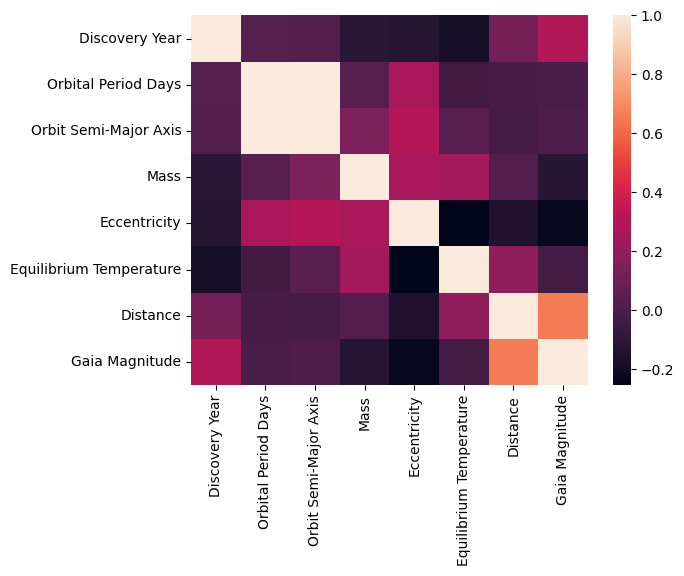

In [29]:
# Vemos un tipo de matriz de correlación
corr = df_exo.corr() 
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=False)


C:\Users\sjfer\AppData\Local\Temp\ipykernel_460\801792552.py:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



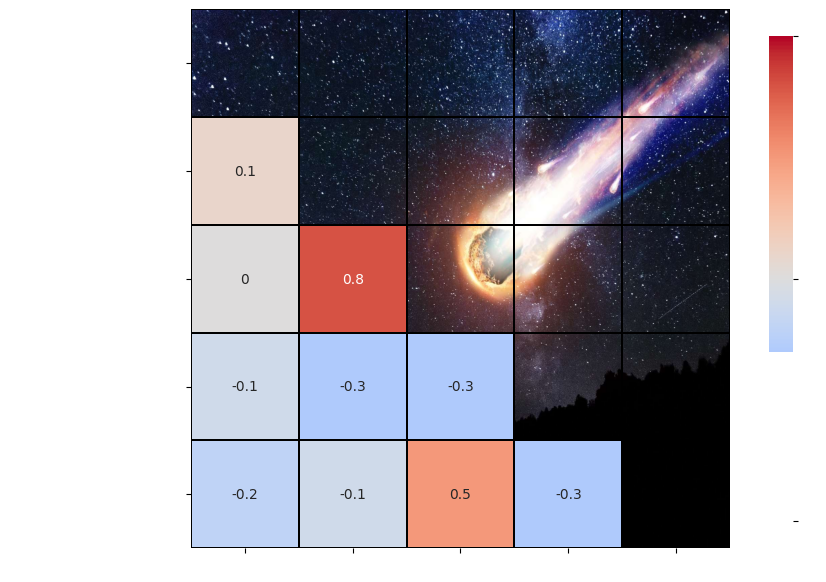

In [30]:
# Spearman sirve para comprobar la relación lineal entre dos variables.

corr = df_exo.corr(method = 'spearman').sort_values(by = 'Discovery Year', axis = 0, ascending = False).sort_values(by = 'Discovery Year', axis = 1, ascending = False).round(1)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,7))
f.set_facecolor("black")

cmap = "coolwarm"

#Añadimos la imagen de fondo que nos hemos descargado
img = imread(r"C:\Users\sjfer\Silvilio python upgrade hub\Modulo Proyecto final\imagenes\pexels-pixabay-220201.jpg")

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr.iloc[0:5,0:5], mask=mask[0:5,0:5], cmap=cmap, vmax=1, center=0,
    square=True ,linewidths=.1, linecolor="black", cbar_kws={"shrink": 0.9},annot = True, annot_kws={"size": 10})

cbar = ax.collections[0].colorbar
cbar.set_ticks([-1,0,1])
cbar.set_ticklabels(["-1","0","1"])

for t in cbar.ax.get_yticklabels():
    t.set_color("white")
ax.tick_params(axis='x', labelcolor='white')

f.set_facecolor((0, 0, 0, 0))
ax.set_xticklabels(ax.get_xticklabels(),fontsize=10 , color='white', rotation= 0)  # Variables blancas
ax.set_yticklabels(ax.get_yticklabels(),fontsize=10 , color='white')  # Variables blancas

plt.imshow(img, zorder=0, extent=[0, 6, 0, 5], origin="lower")

plt.show()

### ¿En qué año se descubrió el primer exoplaneta y cuál ha sido el año que se descubrieron más?

In [31]:
df_exo["Discovery Year"].min()

1989

In [32]:
exoplanetas_por_ano = df_exo.groupby("Discovery Year").count().reset_index() 

# Crear el gráfico de líneas 
fig = go.Figure() 
fig.add_trace(go.Bar( 
    x=exoplanetas_por_ano["Discovery Year"], 
    y=exoplanetas_por_ano["Planet Name"], 
    name='Exoplanetas por año',
    text=exoplanetas_por_ano["Planet Name"],
    texttemplate="%{y}",
    textposition="auto",
    marker_color="#d9ad26")) 

fig.show()

In [33]:
df_exo[df_exo["Discovery Year"]==1989]

,Planet Name,Discovery Method,Discovery Year,Discovery Facility,Orbital Period Days,Orbit Semi-Major Axis,Mass,Eccentricity,Equilibrium Temperature,Distance,Gaia Magnitude
491,HD 114762 b,Radial Velocity,1989,Oak Ridge Observatory,83.9151,0.36,3397.6027,0.34,NaN,40.1949,7.13955


In [34]:
df_exo[df_exo["Discovery Year"]==1995]

,Planet Name,Discovery Method,Discovery Year,Discovery Facility,Orbital Period Days,Orbit Semi-Major Axis,Mass,Eccentricity,Equilibrium Temperature,Distance,Gaia Magnitude
26,51 Peg b,Radial Velocity,1995,Haute-Provence Observatory,4.230785,0.0527,150.009,0.013,NaN,15.4614,5.28647


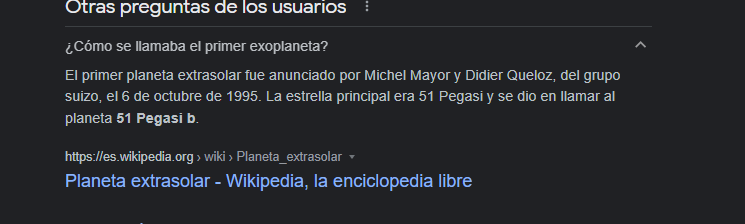

¿Qué métodos de descubrimiento de exoplanetas es más efectivo?

In [35]:
df_exo["Discovery Method"].value_counts()

Transit                          3444
Radial Velocity                   899
Microlensing                      120
Imaging                            54
Transit Timing Variations          22
Eclipse Timing Variations          16
Orbital Brightness Modulation       9
Pulsar Timing                       7
Pulsation Timing Variations         2
Astrometry                          1
Disk Kinematics                     1
Name: Discovery Method, dtype: int64

In [36]:
df_exo_discovery_method = df_exo["Discovery Method"].value_counts().reset_index()
df_exo_discovery_method.columns = ['Discovery Method', 'count']
fig = px.treemap(df_exo_discovery_method, path=['Discovery Method'], values='count')
fig.show()

In [37]:
# Contar las ocurrencias de cada método de descubrimiento
metodos = df_exo["Discovery Method"].value_counts().reset_index()
metodos.columns = ["Discovery Method", "Count"]

# Crear el gráfico de embudo
fig6 = px.funnel(metodos, x="Discovery Method", y="Count", text="Count")
fig.show()

In [38]:
fig = px.pie(df_exo["Discovery Method"].value_counts(), values=df_exo["Discovery Method"].value_counts().values,
names=df_exo["Discovery Method"].value_counts().index, title="Exoplanetas por método de descubrimiento")

fig.show()

In [39]:
fig = px.pie(df_exo["Discovery Facility"].value_counts().head(5), values=df_exo["Discovery Facility"].value_counts().head(5).values,
names=df_exo["Discovery Facility"].value_counts().head(5).index, title="Exoplanetas por Instalación de Descubrimiento")

fig.show()

In [40]:
df_exo_grouped = df_exo.groupby(["Discovery Year", "Discovery Facility"]).size().reset_index(name="count")
df_exo_grouped = df_exo_grouped.sort_values(by="count", ascending=False)
fig = px.bar(df_exo_grouped, x="Discovery Year", y="count", color="Discovery Facility", barmode="stack")
fig.show()

In [41]:
df_exo.shape

(4575, 11)

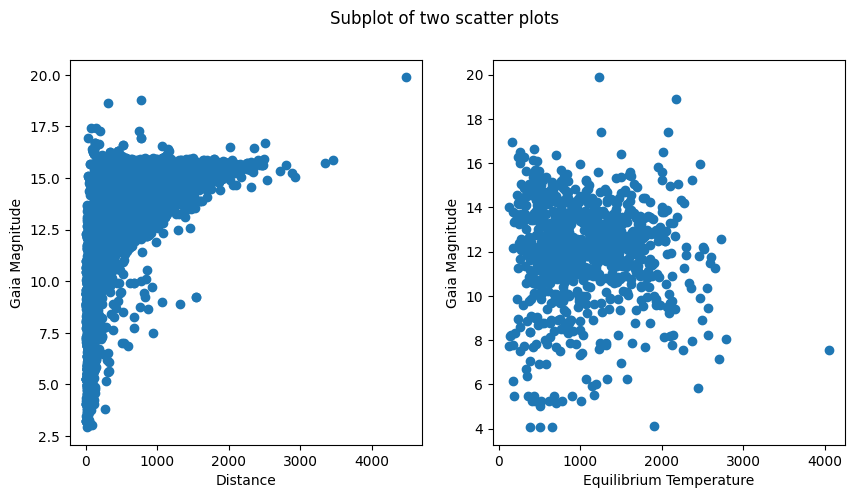

In [42]:
# Create a figure and axis objects for each subplot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), facecolor=(1, 1, 1, 0))

# Plot the first scatter plot on the first axis
ax1.scatter(df_exo["Distance"], df_exo["Gaia Magnitude"])
ax1.set_xlabel("Distance")
ax1.set_ylabel("Gaia Magnitude")

# Plot the second scatter plot on the second axis
ax2.scatter(df_exo["Equilibrium Temperature"], df_exo["Gaia Magnitude"])
ax2.set_xlabel("Equilibrium Temperature")
ax2.set_ylabel("Gaia Magnitude")

# Add a title to the figure
fig.suptitle("Subplot of two scatter plots")

# Display the plot
plt.show()

In [43]:
fig = px.scatter(df_exo, x="Equilibrium Temperature", y="Distance", trendline="ols" )
fig.show()

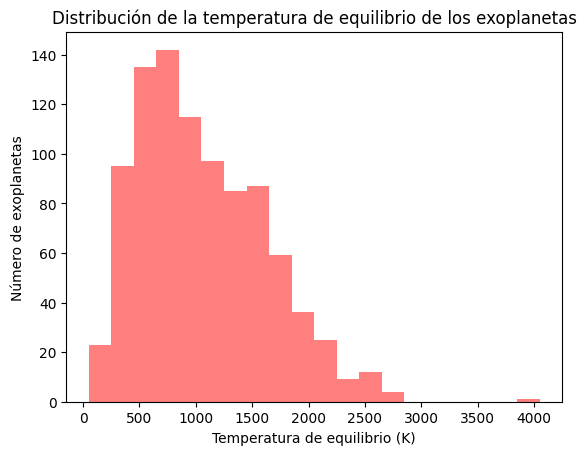

In [44]:
# A continuación, creas un histograma con la variable "Equilibrium Temperature"
plt.hist(df_exo["Equilibrium Temperature"], bins=20, color="red", alpha=0.5)

# Agregas un título y etiquetas para los ejes
plt.title("Distribución de la temperatura de equilibrio de los exoplanetas")
plt.xlabel("Temperatura de equilibrio (K)")
plt.ylabel("Número de exoplanetas")

# Muestras el gráfico
plt.show()

In [45]:
df_exo.columns

Index(['Planet Name', 'Discovery Method', 'Discovery Year',
       'Discovery Facility', 'Orbital Period Days', 'Orbit Semi-Major Axis',
       'Mass', 'Eccentricity', 'Equilibrium Temperature', 'Distance',
       'Gaia Magnitude'],
      dtype='object')

In [46]:
df_exo.isnull().mean().sort_values(ascending=False)*100

Equilibrium Temperature    79.781421
Eccentricity               62.688525
Mass                       56.153005
Orbit Semi-Major Axis      39.606557
Gaia Magnitude              3.825137
Orbital Period Days         3.540984
Distance                    2.273224
Planet Name                 0.000000
Discovery Method            0.000000
Discovery Year              0.000000
Discovery Facility          0.000000
dtype: float64

In [47]:
df_exo.columns

Index(['Planet Name', 'Discovery Method', 'Discovery Year',
       'Discovery Facility', 'Orbital Period Days', 'Orbit Semi-Major Axis',
       'Mass', 'Eccentricity', 'Equilibrium Temperature', 'Distance',
       'Gaia Magnitude'],
      dtype='object')

In [48]:
df_exo.isnull().sum()

Planet Name                   0
Discovery Method              0
Discovery Year                0
Discovery Facility            0
Orbital Period Days         162
Orbit Semi-Major Axis      1812
Mass                       2569
Eccentricity               2868
Equilibrium Temperature    3650
Distance                    104
Gaia Magnitude              175
dtype: int64

---

---

---

# <center> MISIONES ESPACIALES <center>

**EXPLICACIÓN MISIONES**

Company	Company responsible for the space mission <br>
1	Location	Location of the launch<br>
2	Date	Date of the launch<br>
3	Time	Time of the launch (UTC)<br>
4	Rocket	Name of the rocket used for the mission<br>
5	Mission	Name of the space mission (or missions)<br>
6	RocketStatus	Status of the rocket as of August 2022 (Active...<br>
7	Price	Cost of the rocket in millions of US dollars<br>
8	MissionStatus	Status of the mission (Success, Failure, Parti...<br>

In [49]:
# Data de las misiones espaciales
df_missions = pd.read_csv("datasets proyecto final/space_missions.csv",encoding = "ISO-8859-1", skipinitialspace = True)
df_missions_dictionary = pd.read_csv("datasets proyecto final/space_missions_data_dictionary.csv")

In [50]:
# Vemos que tiene el dataset
df_missions.head(5)

,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus
0,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-10-04,19:28:00,Sputnik 8K71PS,Sputnik-1,Retired,NaN,Success
1,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-11-03,02:30:00,Sputnik 8K71PS,Sputnik-2,Retired,NaN,Success
2,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1957-12-06,16:44:00,Vanguard,Vanguard TV3,Retired,NaN,Failure
3,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA",1958-02-01,03:48:00,Juno I,Explorer 1,Retired,NaN,Success
4,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1958-02-05,07:33:00,Vanguard,Vanguard TV3BU,Retired,NaN,Failure


In [51]:
# Observamos información general del dataset, como sus variables, el tipo y los nulos que tienen. 
df_missions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4630 entries, 0 to 4629
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Company        4630 non-null   object
 1   Location       4630 non-null   object
 2   Date           4630 non-null   object
 3   Time           4503 non-null   object
 4   Rocket         4630 non-null   object
 5   Mission        4630 non-null   object
 6   RocketStatus   4630 non-null   object
 7   Price          1265 non-null   object
 8   MissionStatus  4630 non-null   object
dtypes: object(9)
memory usage: 325.7+ KB


In [52]:
# Preprocesamos
# Extraemos de Location el país y creamos una nueva columna con ello
df_missions['Country'] = df_missions['Location'].str.extract(r',\s*([A-Za-z ]+)$')

# Borramos la variable Time, ya que no me aporta demasiada información
df_missions = df_missions.drop('Time', axis=1)


In [53]:
# Cambiamos el tipo de columna de object a formato fecha para Date
df_missions['Date'] = pd.to_datetime(df_missions['Date'], utc=True).dt.date
df_missions['Date'] = pd.to_datetime(df_missions['Date'])

In [54]:
df_missions.head(1)

,Company,Location,Date,Rocket,Mission,RocketStatus,Price,MissionStatus,Country
0,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-10-04,Sputnik 8K71PS,Sputnik-1,Retired,NaN,Success,Kazakhstan


In [55]:
df_missions["Rocket"].nunique()

370

In [56]:
df_missions["Country"] = df_missions["Country"].astype(str)
df_missions["MissionStatus"] = df_missions["MissionStatus"].astype(str)

In [57]:
df_missions.dtypes

Company                  object
Location                 object
Date             datetime64[ns]
Rocket                   object
Mission                  object
RocketStatus             object
Price                    object
MissionStatus            object
Country                  object
dtype: object

In [58]:
# Creamos una copia del dataframe sin valores nulos, para analizar los precios aparte
df_missions_price = df_missions.dropna()

# Del nuevo df con el precio limpio, quitamos las "," y hacemos la variable numérica
df_missions_price.Price = df_missions_price.Price.astype(str).str.replace(',', '')
df_missions_price.Price = pd.to_numeric(df_missions_price.Price)

C:\Users\sjfer\AppData\Local\Temp\ipykernel_460\1867592642.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sjfer\AppData\Local\Temp\ipykernel_460\1867592642.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
df_missions_price.head(1)

,Company,Location,Date,Rocket,Mission,RocketStatus,Price,MissionStatus,Country
303,US Air Force,"SLC-20, Cape Canaveral AFS, Florida, USA",1964-09-01,Titan IIIA,Transtage 1,Retired,63.23,Failure,USA


In [60]:
df_missions.head(1)

,Company,Location,Date,Rocket,Mission,RocketStatus,Price,MissionStatus,Country
0,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-10-04,Sputnik 8K71PS,Sputnik-1,Retired,NaN,Success,Kazakhstan


In [61]:
df_price_top10 = df_missions_price['Price']
df_top_price = df_price_top10.nlargest(10)
df_top_price

2323    5000.0
2407    5000.0
607     1160.0
640     1160.0
720     1160.0
739     1160.0
763     1160.0
778     1160.0
812     1160.0
848     1160.0
Name: Price, dtype: float64

<AxesSubplot: xlabel='MissionStatus', ylabel='Country'>

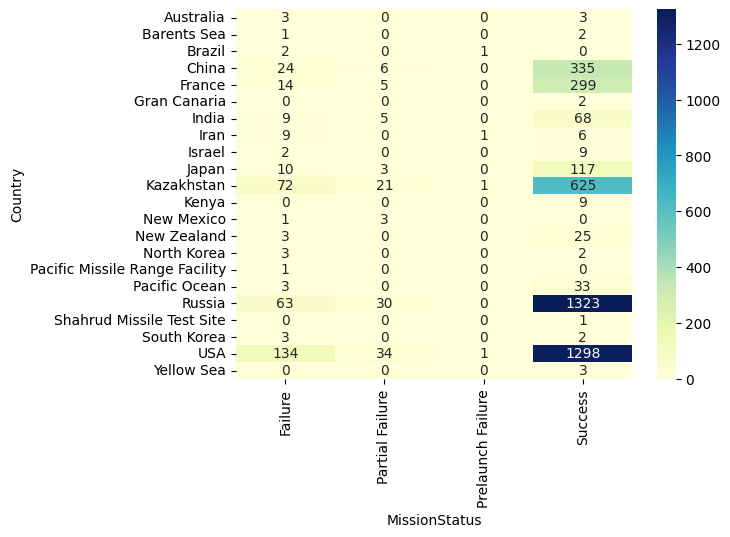

In [62]:

# selecciona las variables necesarias
df_country_missionstatus = df_missions[['Country', 'MissionStatus']]

# crea la tabla de contingencia cruzada
ct = pd.crosstab(df_country_missionstatus['Country'], df_country_missionstatus['MissionStatus'])

# grafica la tabla de contingencia cruzada
sns.heatmap(ct, annot=True, cmap="YlGnBu", fmt='d')

In [63]:
from scipy.stats import chi2_contingency
# selecciona las variables necesarias
df_location_missionstatus = df_missions[['Country', 'MissionStatus']]
# calcula el chi-cuadrado
chi2, pval, dof, expected = chi2_contingency(ct)
# imprime el resultado
print('Chi-cuadrado:', chi2)
print('p-valor:', pval)

Chi-cuadrado: 744.0847364407593
p-valor: 4.972397480935078e-117


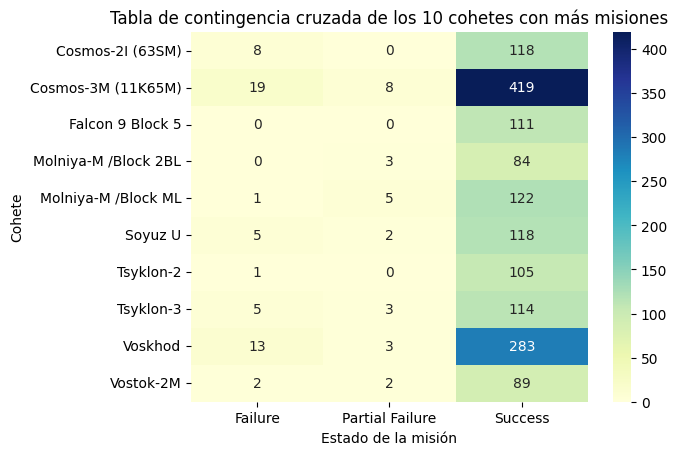

In [64]:
# Obtener los 10 cohetes con más misiones
top_rockets = df_missions['Rocket'].value_counts().head(10).index.to_list()

# Filtrar df_missions para incluir solo las misiones de los 10 cohetes con más misiones
df_top_rockets = df_missions[df_missions['Rocket'].isin(top_rockets)]

# Seleccionar las variables necesarias
df_top_rockets = df_top_rockets[['Rocket', 'MissionStatus']]

# Crear la tabla de contingencia cruzada
ct2 = pd.crosstab(df_top_rockets['Rocket'], df_top_rockets['MissionStatus'])

# Graficar la tabla de contingencia cruzada
sns.heatmap(ct2, annot=True, cmap="YlGnBu", fmt='d')

# Mostrar la gráfica en Streamlit
plt.title('Tabla de contingencia cruzada de los 10 cohetes con más misiones')
plt.xlabel('Estado de la misión')
plt.ylabel('Cohete')
plt.show()

In [65]:
from scipy.stats import chi2_contingency
# selecciona las variables necesarias
df_location_missionstatus = df_missions[['Country', 'MissionStatus']]
# calcula el chi-cuadrado
chi2, pval, dof, expected = chi2_contingency(ct2)
# imprime el resultado
print('Chi-cuadrado:', chi2)
print('p-valor:', pval)

Chi-cuadrado: 31.299732587761305
p-valor: 0.02657119040683537


In [66]:
df_missions_price["Price"].sum()


162304.45

### Preprocesamiento de datos

In [67]:
df_missions["Country"] = df_missions["Country"].str.strip()
df_missions["MissionStatus"] = df_missions["MissionStatus"].str.strip()

In [68]:
df_missions["Country"] = df_missions["Country"].astype(str)
df_missions["MissionStatus"] = df_missions["MissionStatus"].astype(str)

In [69]:
df_missions["Country"] = df_missions["Country"].apply(str)
df_missions["MissionStatus"] = df_missions["MissionStatus"].apply(str)

In [70]:
df_missions["Country"].unique()

array(['Kazakhstan', 'USA', 'Russia', 'France', 'Japan', 'Kenya',
       'Australia', 'China', 'India', 'Israel', 'Gran Canaria', 'Brazil',
       'Barents Sea', 'North Korea', 'Pacific Ocean', 'Iran',
       'South Korea', 'Pacific Missile Range Facility', 'New Zealand',
       'New Mexico', 'Yellow Sea', 'Shahrud Missile Test Site'],
      dtype=object)

In [71]:
df_missions.dtypes

Company                  object
Location                 object
Date             datetime64[ns]
Rocket                   object
Mission                  object
RocketStatus             object
Price                    object
MissionStatus            object
Country                  object
dtype: object

In [72]:
from scipy.stats import chi2_contingency
# selecciona las variables necesarias
df_location_missionstatus = df_missions[['Country', 'MissionStatus']]
# calcula el chi-cuadrado
chi2, pval, dof, expected = chi2_contingency(ct)
# imprime el resultado
print('Chi-cuadrado:', chi2)
print('p-valor:', pval)

Chi-cuadrado: 744.0847364407593
p-valor: 4.972397480935078e-117


<AxesSubplot: xlabel='MissionStatus', ylabel='Rocket'>

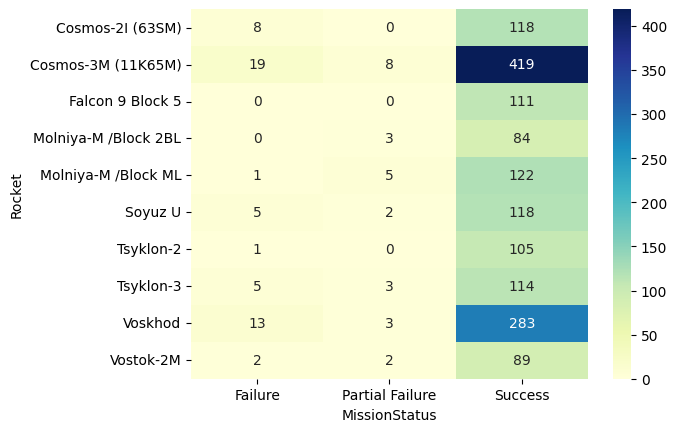

In [79]:
# selecciona el top 10 de cohetes más usados
df_top_rockets = df_missions.groupby('Rocket').size().sort_values(ascending=False).head(10).reset_index(name='count')

# selecciona los datos para los cohetes seleccionados
df_top_rockets_data = df_missions[df_missions['Rocket'].isin(df_top_rockets['Rocket'])]

# selecciona las variables necesarias
df_rocket_missionstatus = df_top_rockets_data[['Rocket', 'MissionStatus']]

# crea la tabla de contingencia cruzada
ct = pd.crosstab(df_rocket_missionstatus['Rocket'], df_rocket_missionstatus['MissionStatus'])

# grafica la tabla de contingencia cruzada
sns.heatmap(ct, annot=True, cmap="YlGnBu", fmt='d')

#### Éxito de las misiones espaciales

In [80]:
df_missions["MissionStatus"].value_counts()

Success              4162
Failure               357
Partial Failure       107
Prelaunch Failure       4
Name: MissionStatus, dtype: int64

In [ ]:
fig8 = px.pie(df_missions["MissionStatus"].value_counts(), values=df_missions["MissionStatus"].value_counts().values,
    names=df_missions["MissionStatus"].value_counts().index)
#fig8.update_layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)')
fig8.show()
    #st.plotly_chart(fig8)

### Éxito de las misiones espaciales por país

In [ ]:
fig9= px.histogram(df_missions, x = "Country", color = "MissionStatus", text_auto=True )
#fig9.update_layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)')
fig9.show()

In [ ]:
fig9= px.histogram(df_missions_price, x = "Price", color = "MissionStatus", text_auto=True )
#fig9.update_layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)')
fig9.show()

In [ ]:
df_missions["Company"].value_counts().head(10)

RVSN USSR           1777
CASC                 338
Arianespace          293
General Dynamics     251
VKS RF               216
NASA                 203
SpaceX               182
US Air Force         161
ULA                  151
Boeing               136
Name: Company, dtype: int64

In [ ]:
# Sacamos top 12 de las compañías con más misiones espaciales
df_missions['Company'].value_counts().nlargest(12).index.tolist()

['RVSN USSR',
 'CASC',
 'Arianespace',
 'General Dynamics',
 'VKS RF',
 'NASA',
 'SpaceX',
 'US Air Force',
 'ULA',
 'Boeing',
 'Martin Marietta',
 'Northrop']

In [ ]:
df_missions.dtypes

Company                  object
Location                 object
Date             datetime64[ns]
Rocket                   object
Mission                  object
RocketStatus             object
Price                    object
MissionStatus            object
Country                  object
dtype: object

In [ ]:
# Filtramos por las misiones únicamente de Estados Unidos
df_missions[df_missions["Country"] =="USA"]

,Company,Location,Date,Rocket,Mission,RocketStatus,Price,MissionStatus,Country
2,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1957-12-06,Vanguard,Vanguard TV3,Retired,NaN,Failure,USA
3,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA",1958-02-01,Juno I,Explorer 1,Retired,NaN,Success,USA
4,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1958-02-05,Vanguard,Vanguard TV3BU,Retired,NaN,Failure,USA
5,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA",1958-03-05,Juno I,Explorer 2,Retired,NaN,Failure,USA
6,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1958-03-17,Vanguard,Vanguard 1,Retired,NaN,Success,USA
...,...,...,...,...,...,...,...,...,...
4619,Astra,"SLC-46, Cape Canaveral SFS, Florida, USA",2022-07-12,Rocket 3,TROPICS Flight 1,Active,2.5,Failure,USA
4622,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA",2022-07-15,Falcon 9 Block 5,CRS SpX-25,Active,67,Success,USA
4624,SpaceX,"SLC-40, Cape Canaveral SFS, Florida, USA",2022-07-17,Falcon 9 Block 5,Starlink Group 4-22,Active,67,Success,USA
4625,SpaceX,"SLC-4E, Vandenberg SFB, California, USA",2022-07-22,Falcon 9 Block 5,Starlink Group 3-2,Active,67,Success,USA


### Éxito de las misiones según su compañía

In [ ]:
fig10= px.histogram(df_missions, x = "Company", color = "MissionStatus", text_auto=True )
#fig10.update_layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)')
fig10.show()

In [ ]:
df_count = df_missions.groupby(['Country', pd.Grouper(key='Date', freq='Y')])['MissionStatus'].count().reset_index()
df_count = df_count[df_count['Country'].isin(['USA', 'Russia'])]
df_count.rename(columns={'MissionStatus': 'Count'}, inplace=True)
df_count.head(10)



,Country,Date,Count
321,Russia,1961-12-31,2
322,Russia,1962-12-31,8
323,Russia,1963-12-31,8
324,Russia,1964-12-31,8
325,Russia,1965-12-31,10
326,Russia,1966-12-31,15
327,Russia,1967-12-31,37
328,Russia,1968-12-31,40
329,Russia,1969-12-31,45
330,Russia,1970-12-31,59


In [ ]:
fig = px.line(df_count, x='Date', y='Count', color='Country', markers= True)
fig.add_annotation(x='1991', y=30, text="Disolución de la URSS")
fig.add_annotation(x='1969', y=22, text="Llegada a la luna")

fig.show()

### Usamos pandas profiling para hacernos una idea global de todo el contenido de los 3 datasets

In [74]:
from pandas_profiling import ProfileReport
profile  =  ProfileReport (df_meteorites ,  title = "Meteorites", dark_mode=True )

In [75]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [77]:
profile2  =  ProfileReport (df_exo ,  title = "Exoplanets", dark_mode=True )
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [78]:
profile3  =  ProfileReport (df_missions ,  title = "Space Missions", dark_mode=True )
profile3

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Sí. Existen varios métodos para medir la asociación entre variables categóricas. Uno de los más comunes es la prueba de Chi-Cuadrado, que mide la asociación entre dos variables categóricas al evaluar si los datos observados se diferencian significativamente de los datos esperados. También hay algunos otros métodos, como la prueba de contingencia, la prueba de homogeneidad y la prueba de independencia.


Puedes explicarme la prueba chi-cuadrado y ponerme el código para hacerlo con mi df_missions con estas variables: Company	Location	Date	Rocket	Mission	RocketStatus	Price	MissionStatus	Country , por favor? 

La prueba Chi-Cuadrado se utiliza para evaluar si dos variables categóricas están relacionadas entre sí. La prueba toma los datos del conteo de la matriz de contingencia, que es una tabla que muestra la frecuencia de los casos de cada combinación de dos variables. Por ejemplo, si estás tratando de ver si la ubicación (Location) y el estatus de la misión (MissionStatus) están relacionadas, necesitas crear una tabla que muestre la cantidad de veces que cada combinación de estas dos variables ha ocurrido. Después de eso, se calcula un valor de chi-cuadrado que indica si los datos observados se diferencian significativamente de los datos esperados.


Sí. Una forma de visualizar la correlación entre variables categóricas es mediante una tabla de contingencia cruzada. Esta tabla contiene los conteos de los casos para cada combinación de dos variables. Estos conteos se pueden mostrar en una tabla de barras, que muestra gráficamente la relación entre las variables. También se pueden utilizar gráficos de caja para mostrar la distribución de los datos para cada variable individual.